In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.graph_objects as go
import plotly.express as px
import dash
from dash import Dash

In [2]:
df_cancer = pd.read_csv('/home/donerick/Data-science/DATA/prostate_cancer_prediction.csv')
df_cancer.head()

,Patient_ID,Age,Family_History,Race_African_Ancestry,PSA_Level,DRE_Result,Biopsy_Result,Difficulty_Urinating,Weak_Urine_Flow,Blood_in_Urine,...,Alcohol_Consumption,Hypertension,Diabetes,Cholesterol_Level,Screening_Age,Follow_Up_Required,Prostate_Volume,Genetic_Risk_Factors,Previous_Cancer_History,Early_Detection
0,1,78,No,Yes,5.07,Normal,Benign,No,No,No,...,Moderate,No,No,Normal,45,No,46.0,No,No,Yes
1,2,68,No,Yes,10.24,Normal,Benign,Yes,No,No,...,Low,No,No,High,65,No,78.2,No,No,Yes
2,3,54,No,No,13.79,Normal,Benign,No,No,No,...,Low,No,No,Normal,61,No,21.1,No,No,Yes
3,4,82,No,No,8.03,Abnormal,Benign,No,No,No,...,Low,No,No,Normal,47,Yes,79.9,No,Yes,Yes
4,5,47,Yes,No,1.89,Normal,Malignant,Yes,Yes,No,...,Moderate,Yes,No,Normal,72,No,32.0,No,No,Yes


In [3]:
""" def mapping(df):
    df_mapping = {
        "No":0, "Yes":1,
        "Normal":1, "Abnormal":2,
        "Benign":1, "Malignant":0,
        "Moderate"
    } """


' def mapping(df):\n    df_mapping = {\n        "No":0, "Yes":1,\n        "Normal":1, "Abnormal":2,\n        "Benign":1, "Malignant":0,\n        "Moderate"\n    } '

### EDA

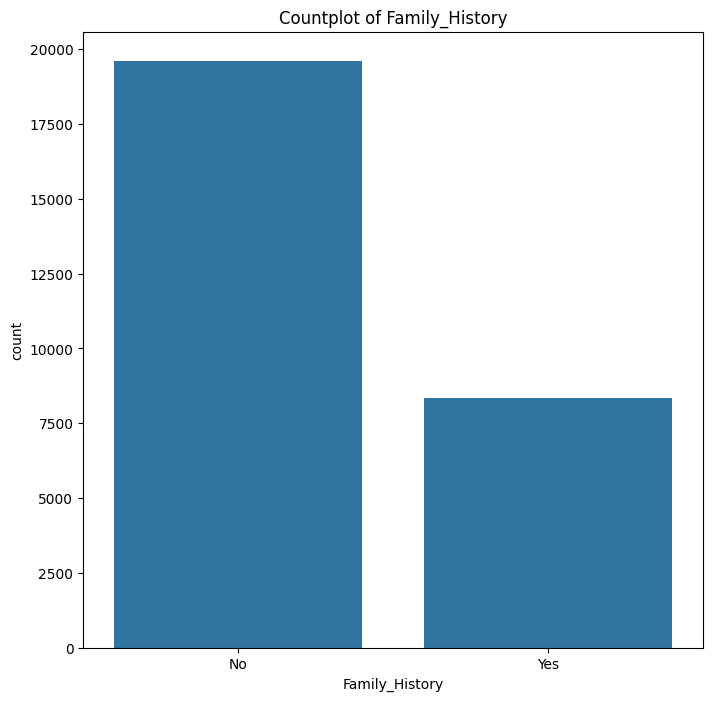

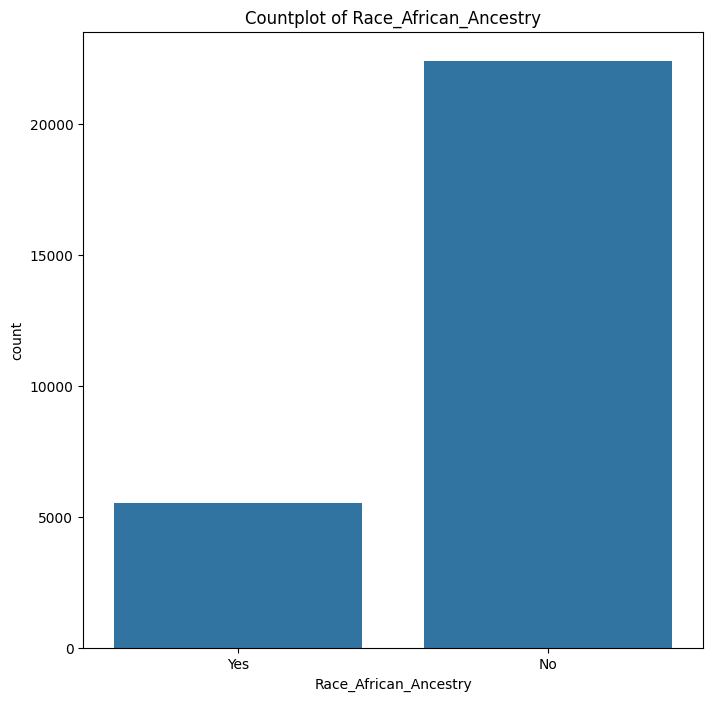

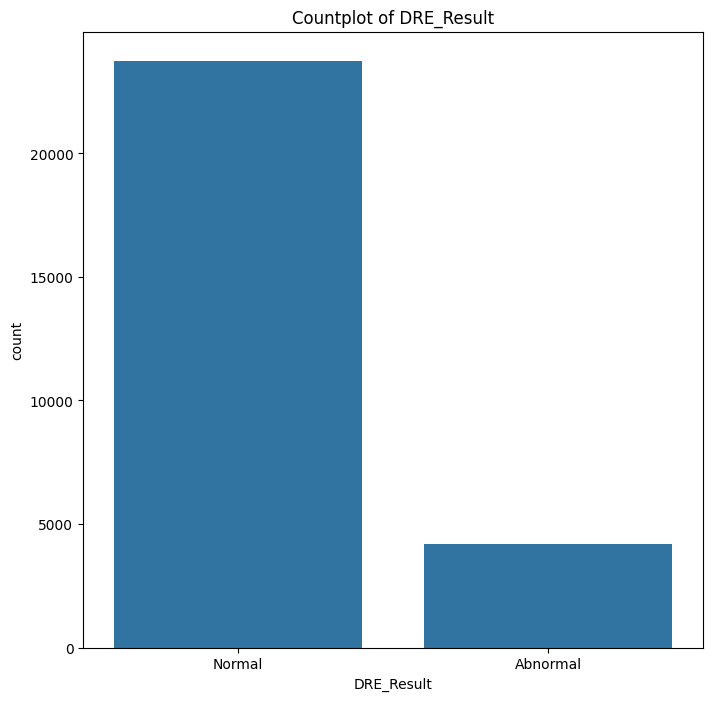

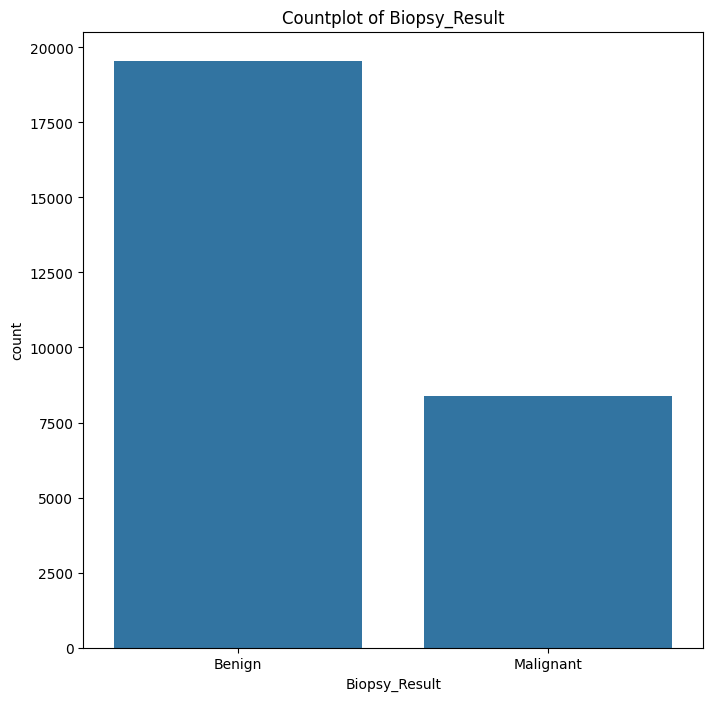

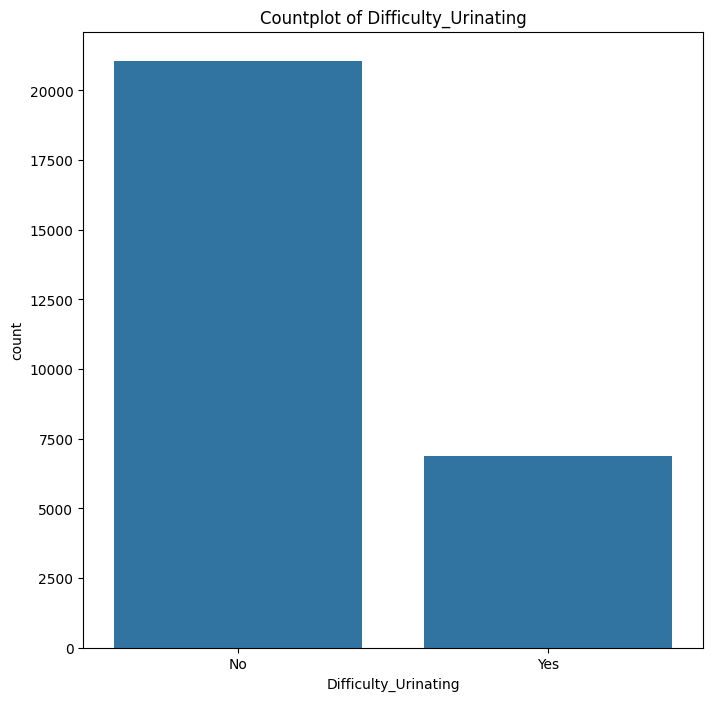

...

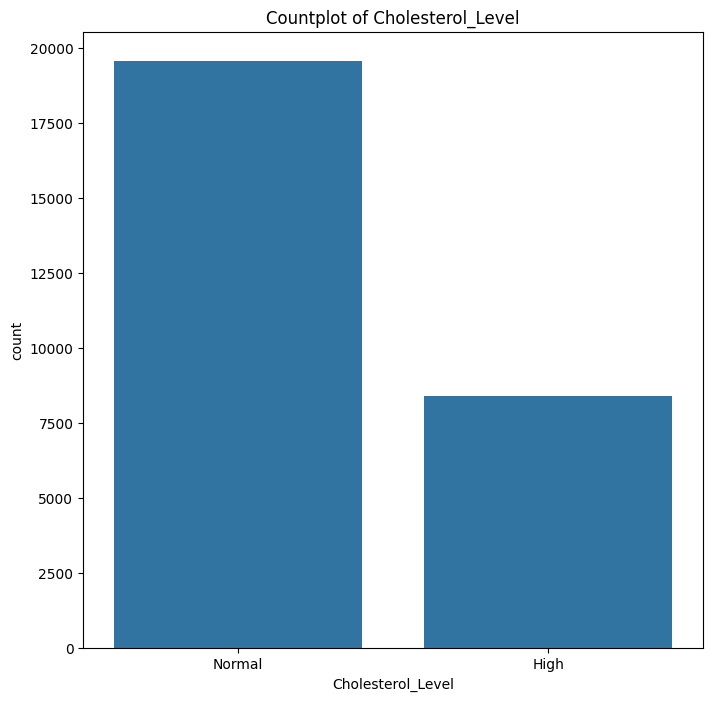

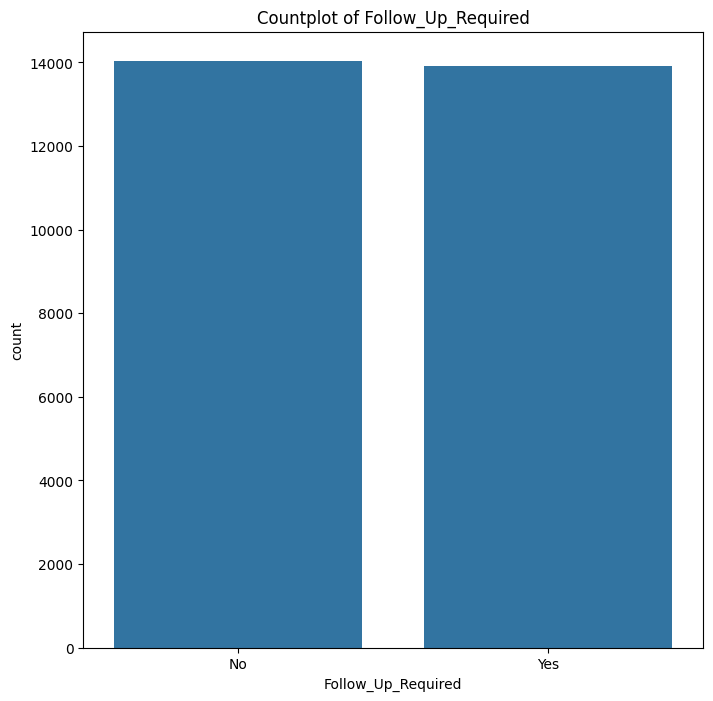

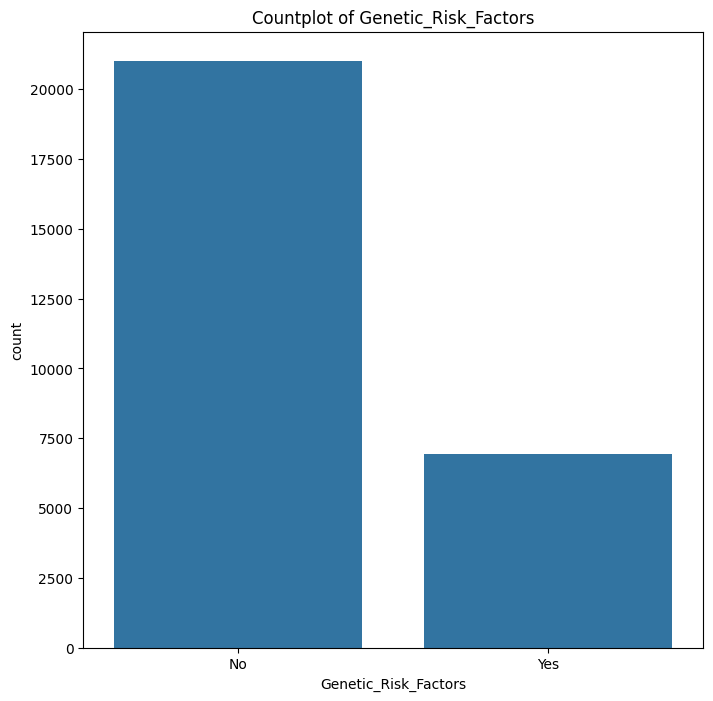

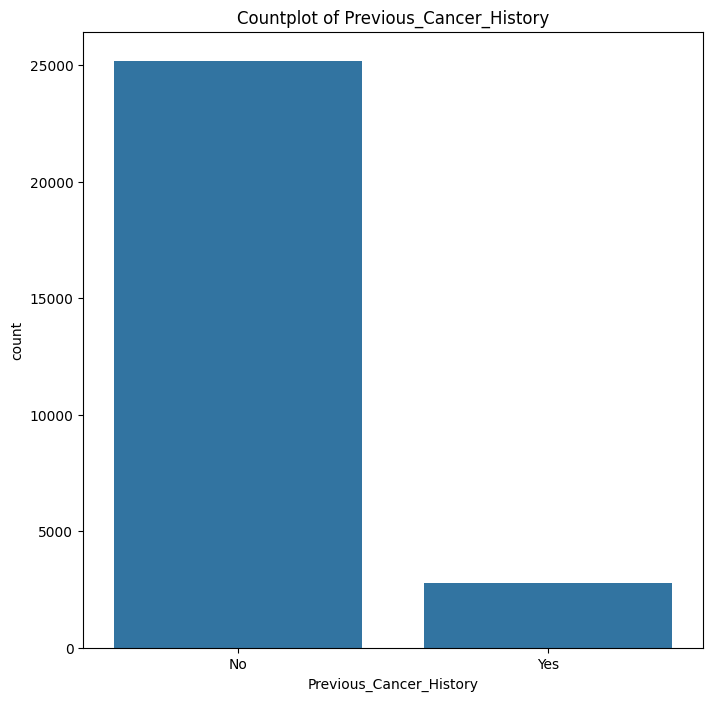

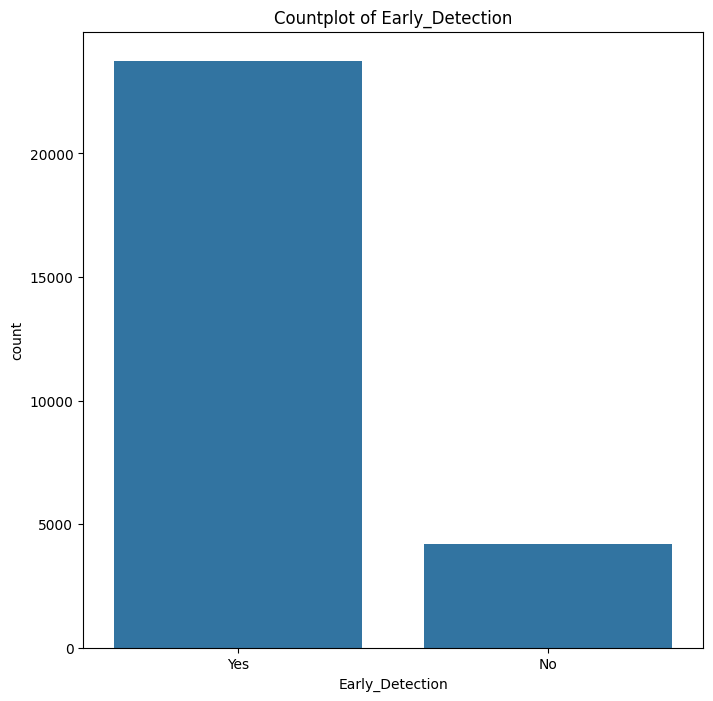

30

In [4]:
cat_cols = df_cancer.select_dtypes(include='object')

def eda_analysis(data):
    for col in cat_cols.columns:
        plt.figure(figsize=(8,8))
        df_count = data[col].value_counts().reset_index()
        df_count.columns = [col, "count"]
        # diagramme circulaire
        fig_pie = px.pie(df_count, values="count",names=col)
        fig_pie.update_layout(title=dict(text=f"Distribution de la variable {col}",
                                         font=dict(size=20)))
        fig_pie.show()
        
        # boplot
        fig_box = px.box(data_frame=data, x=col)
        fig_box.update_layout(title=dict(text=f"Distribution de la variable {col}", font=dict(size=20)))
        fig_box.show()
        
        # countplot
        sns.countplot(data=data, x=col)
        plt.title(f'Countplot of {col}')
        plt.show()
    return fig_box, fig_pie

eda_analysis(df_cancer)        
len(df_cancer.columns)

In [5]:
df_cancer.isnull().sum()

Patient_ID                 0
Age                        0
Family_History             0
Race_African_Ancestry      0
PSA_Level                  0
DRE_Result                 0
Biopsy_Result              0
Difficulty_Urinating       0
Weak_Urine_Flow            0
Blood_in_Urine             0
Pelvic_Pain                0
Back_Pain                  0
Erectile_Dysfunction       0
Cancer_Stage               0
Treatment_Recommended      0
Survival_5_Years           0
Exercise_Regularly         0
Healthy_Diet               0
BMI                        0
Smoking_History            0
Alcohol_Consumption        0
Hypertension               0
Diabetes                   0
Cholesterol_Level          0
Screening_Age              0
Follow_Up_Required         0
Prostate_Volume            0
Genetic_Risk_Factors       0
Previous_Cancer_History    0
Early_Detection            0
dtype: int64

In [6]:
df_cancer.shape

(27945, 30)

In [7]:
df_cancer.columns

Index(['Patient_ID', 'Age', 'Family_History', 'Race_African_Ancestry',
       'PSA_Level', 'DRE_Result', 'Biopsy_Result', 'Difficulty_Urinating',
       'Weak_Urine_Flow', 'Blood_in_Urine', 'Pelvic_Pain', 'Back_Pain',
       'Erectile_Dysfunction', 'Cancer_Stage', 'Treatment_Recommended',
       'Survival_5_Years', 'Exercise_Regularly', 'Healthy_Diet', 'BMI',
       'Smoking_History', 'Alcohol_Consumption', 'Hypertension', 'Diabetes',
       'Cholesterol_Level', 'Screening_Age', 'Follow_Up_Required',
       'Prostate_Volume', 'Genetic_Risk_Factors', 'Previous_Cancer_History',
       'Early_Detection'],
      dtype='object')

In [8]:
### AGe moyenne des individus dont la biopsy_result et etape de leur cancer
df_stage_age_biopsy=df_cancer.groupby(['Cancer_Stage', "Biopsy_Result"]).agg({"Age":'mean'}).reset_index()

# volume prostate moyenne chez les individus testé positive au cancer de prostate
df_volume_biopsy = df_cancer.groupby('Biopsy_Result')['Prostate_Volume'].agg('mean').reset_index()

#taux moyen de BMi chez les individus souffrant du diabète et ttesté postive ou non
df_bmi_moyen = df_cancer.groupby(['Diabetes', "Early_Detection"]).agg({"BMI":"mean"}).reset_index()

#niveau de moyen de psa_levle enf onction des resultats
df_psa_moyen = df_cancer.groupby(['Early_Detection',"Biopsy_Result"]).agg({"PSA_Level":"mean"})
#

In [9]:
df_stage_age_biopsy

fig_stage = go.Figure(
    data=[go.Bar(
        x=df_stage_age_biopsy['Age'],
        y=df_stage_age_biopsy['Cancer_Stage'],
        name="AGe moyen vs Stage Cancer"),
        
        go.Bar(x=df_stage_age_biopsy['Age'],
               y=df_stage_age_biopsy['Biopsy_Result'],
               name="Age vs Result Biopsy")
    ]
)

fig_stage.update_layout()

In [10]:
df_volume_biopsy
fig_stage = go.Figure(
    data=[go.Bar(
        x=df_volume_biopsy['Prostate_Volume'],
        y=df_volume_biopsy['Biopsy_Result'],
        name="Volume moyen de prostate")
    ]
)

fig_stage.update_layout(title=dict(text=("Volume Moyen de la prostate chez les patients soufrrant du cancer ou non")))

In [11]:
df_bmi_moyen


fig_stage = go.Figure(
    data=[go.Bar(
        x=df_bmi_moyen['BMI'],
        y=df_bmi_moyen['Diabetes'],
        name="Taux moyen BMI chez les patients diabétique"),
        
        go.Bar(x=df_bmi_moyen['BMI'],
               y=df_bmi_moyen['Early_Detection'],
               name="Taux moyen de BMI chez les patients cancereux")
    ]
)

fig_stage.update_layout()



In [ ]:
df_psa_moyen

fig_psa = go.Figure(
    data=[
        go.Bar(x=df_psa_moyen['Biopsy_Result'],
               y=df_psa_moyen['PSA_Level'],
               name="PSA moyen chez les ")
    ]
)

fig_stage.update_layout()

In [17]:
df_psa_moyen

PSA_Level
Early_Detection Biopsy_Result           
No              Benign          7.789202
                Malignant       7.676030
Yes             Benign          7.752781
                Malignant       7.747771

In [18]:
df_cancer.dtypes

Patient_ID                   int64
Age                          int64
Family_History              object
Race_African_Ancestry       object
PSA_Level                  float64
DRE_Result                  object
Biopsy_Result               object
Difficulty_Urinating        object
Weak_Urine_Flow             object
Blood_in_Urine              object
Pelvic_Pain                 object
Back_Pain                   object
Erectile_Dysfunction        object
Cancer_Stage                object
Treatment_Recommended       object
Survival_5_Years            object
Exercise_Regularly          object
Healthy_Diet                object
BMI                        float64
Smoking_History             object
Alcohol_Consumption         object
Hypertension                object
Diabetes                    object
Cholesterol_Level           object
Screening_Age                int64
Follow_Up_Required          object
Prostate_Volume            float64
Genetic_Risk_Factors        object
Previous_Cancer_Hist

In [19]:
## Niveau de PSA en focntion d l'age

def visualize_gloabl(data):
    
    plt.figure(figsize=(12,10))
    fig_psa = go.Figure(
        data=[
            go.Scatter(x=data['Age'], y=data['PSA_Level'],mode='markers',
                    name="Age vs PSA Level"),
            go.Scatter(x = data['Age'], y=data['BMI'],  mode='lines', name="Age vs BMI")
            ]
    )
    fig_psa.update_layout(title=dict(text="Niveau de PSA et de BMI en fonction de l'age"),
                          font=dict(size=12)
                          )
    
    return fig_psa

visualize_gloabl(df_cancer)

<Figure size 1200x1000 with 0 Axes>